In [5]:
import pandas as pd
import numpy as np
import pandas_ta as ta
from backtesting import Backtest, Strategy
from backtesting.lib import crossover
import scipy.stats as stats
import glob

# 定义函数以加载数据并运行回测
def run_backtest(file_path):
    # 加载数据
    data = pd.read_csv(file_path, parse_dates=['Date'])
    data.set_index('Date', inplace=True)

    # 删除NaN值
    data = data.dropna()

    # 定义布林带指标函数
    def indicator(data):
        bbands = ta.bbands(close=data.Close, std=1, length=14)  # 设定标准差和时间周期
        if bbands is not None:
            return bbands[['BBL_14_1.0', 'BBM_14_1.0', 'BBU_14_1.0']].to_numpy().T
        else:
            return np.array([[], [], []])

    # 定义策略类
    class DFStrategy(Strategy):
        def init(self):
            self.bbands = self.I(indicator, self.data.df)

        def next(self):
            lower_band = self.bbands[0]
            upper_band = self.bbands[2]
            if self.position:
                if self.data.Close[-1] > upper_band[-1]:
                    self.position.close()
            else:
                if self.data.Close[-1] < lower_band[-1]:
                    self.buy()

    # 运行回测
    bt = Backtest(data, DFStrategy, cash=10_000)
    stats = bt.run()
    bt.plot()

    # 显示回测结果
    print(f"Backtest results for {file_path}:")
    print(stats)

    # 计算波动率（Volatility）
    returns = data['Close'].pct_change().dropna()
    std_dev_returns = returns.std()
    annual_volatility = std_dev_returns * np.sqrt(252)
    current_volatility = std_dev_returns
    historical_volatility = returns.rolling(window=252).std().dropna().mean()

    print(f"Standard Deviation of Returns: {std_dev_returns:.4f}")
    print(f"Annual Volatility: {annual_volatility:.4f}")
    print(f"Current Volatility: {current_volatility:.4f}")
    print(f"Historical Volatility: {historical_volatility:.4f}")

    # 计算最大回撤（Maximum Drawdown）
    equity_curve = stats['_equity_curve']['Equity']
    max_drawdown = ((equity_curve / equity_curve.cummax()) - 1).min()
    print(f"Maximum Drawdown: {max_drawdown:.4f}")

    # 计算贝塔系数（Beta）
    market_returns = data['Close'].pct_change().dropna()
    cov_matrix = np.cov(returns, market_returns)
    beta = cov_matrix[0, 1] / cov_matrix[1, 1]
    print(f"Beta: {beta:.4f}")

    # 计算在险价值（Value-at-Risk, VaR）
    confidence_level = 0.95
    VaR = np.percentile(returns, (1 - confidence_level) * 100)
    print(f"VaR at {confidence_level*100}% confidence level: {VaR:.4f}")

    # 计算条件在险价值（Conditional VaR, CVaR）
    CVaR = returns[returns <= VaR].mean()
    print(f"CVaR at {confidence_level*100}% confidence level: {CVaR:.4f}")

# 获取所有股票文件的路径
file_paths = glob.glob('./Datasets/*.csv')

# 遍历每个文件并运行回测
for file_path in file_paths:
    run_backtest(file_path)


C:\Users\23713\anaconda3\envs\pytorch\lib\site-packages\backtesting\_plotting.py:250: UserWarning: DatetimeFormatter scales now only accept a single format. Using the first provided: '%d %b'
  formatter=DatetimeTickFormatter(days=['%d %b', '%a %d'],
C:\Users\23713\anaconda3\envs\pytorch\lib\site-packages\backtesting\_plotting.py:250: UserWarning: DatetimeFormatter scales now only accept a single format. Using the first provided: '%m/%Y'
  formatter=DatetimeTickFormatter(days=['%d %b', '%a %d'],


Backtest results for ./Datasets\INTC.csv:
Start                     2014-01-02 00:00:00
End                       2023-12-29 00:00:00
Duration                   3648 days 00:00:00
Exposure Time [%]                   49.841017
Equity Final [$]                 14045.285524
Equity Peak [$]                  17697.052027
Return [%]                          40.452855
Buy & Hold Return [%]               94.842955
Return (Ann.) [%]                    3.460962
Volatility (Ann.) [%]               24.068871
Sharpe Ratio                         0.143794
Sortino Ratio                        0.215353
Calmar Ratio                         0.073921
Max. Drawdown [%]                  -46.819824
Avg. Drawdown [%]                   -5.034744
Max. Drawdown Duration     1708 days 00:00:00
Avg. Drawdown Duration      117 days 00:00:00
# Trades                                   78
Win Rate [%]                        69.230769
Best Trade [%]                       9.692952
Worst Trade [%]                    -24

C:\Users\23713\anaconda3\envs\pytorch\lib\site-packages\backtesting\_plotting.py:250: UserWarning: DatetimeFormatter scales now only accept a single format. Using the first provided: '%d %b'
  formatter=DatetimeTickFormatter(days=['%d %b', '%a %d'],
C:\Users\23713\anaconda3\envs\pytorch\lib\site-packages\backtesting\_plotting.py:250: UserWarning: DatetimeFormatter scales now only accept a single format. Using the first provided: '%m/%Y'
  formatter=DatetimeTickFormatter(days=['%d %b', '%a %d'],


Backtest results for ./Datasets\MO.csv:
Start                     2014-01-02 00:00:00
End                       2023-12-29 00:00:00
Duration                   3648 days 00:00:00
Exposure Time [%]                   46.383148
Equity Final [$]                 10416.842735
Equity Peak [$]                  13910.007269
Return [%]                           4.168427
Buy & Hold Return [%]                6.437989
Return (Ann.) [%]                    0.409876
Volatility (Ann.) [%]               16.762235
Sharpe Ratio                         0.024452
Sortino Ratio                        0.033455
Calmar Ratio                          0.00829
Max. Drawdown [%]                  -49.440533
Avg. Drawdown [%]                   -6.302789
Max. Drawdown Duration     1873 days 00:00:00
Avg. Drawdown Duration      207 days 00:00:00
# Trades                                   74
Win Rate [%]                        63.513514
Best Trade [%]                       7.292125
Worst Trade [%]                    -21.7

C:\Users\23713\anaconda3\envs\pytorch\lib\site-packages\backtesting\_plotting.py:250: UserWarning: DatetimeFormatter scales now only accept a single format. Using the first provided: '%d %b'
  formatter=DatetimeTickFormatter(days=['%d %b', '%a %d'],
C:\Users\23713\anaconda3\envs\pytorch\lib\site-packages\backtesting\_plotting.py:250: UserWarning: DatetimeFormatter scales now only accept a single format. Using the first provided: '%m/%Y'
  formatter=DatetimeTickFormatter(days=['%d %b', '%a %d'],


Backtest results for ./Datasets\O.csv:
Start                     2014-01-02 00:00:00
End                       2023-03-10 00:00:00
Duration                   3354 days 00:00:00
Exposure Time [%]                   45.438824
Equity Final [$]                 12286.184017
Equity Peak [$]                  14667.183604
Return [%]                           22.86184
Buy & Hold Return [%]                69.59615
Return (Ann.) [%]                    2.268511
Volatility (Ann.) [%]               21.879736
Sharpe Ratio                         0.103681
Sortino Ratio                        0.141138
Calmar Ratio                          0.04993
Max. Drawdown [%]                  -45.434101
Avg. Drawdown [%]                   -9.037272
Max. Drawdown Duration     1090 days 00:00:00
Avg. Drawdown Duration      177 days 00:00:00
# Trades                                   67
Win Rate [%]                        64.179104
Best Trade [%]                      15.542048
Worst Trade [%]                    -20.79

C:\Users\23713\anaconda3\envs\pytorch\lib\site-packages\backtesting\_plotting.py:250: UserWarning: DatetimeFormatter scales now only accept a single format. Using the first provided: '%d %b'
  formatter=DatetimeTickFormatter(days=['%d %b', '%a %d'],
C:\Users\23713\anaconda3\envs\pytorch\lib\site-packages\backtesting\_plotting.py:250: UserWarning: DatetimeFormatter scales now only accept a single format. Using the first provided: '%m/%Y'
  formatter=DatetimeTickFormatter(days=['%d %b', '%a %d'],


Backtest results for ./Datasets\PM.csv:
Start                     2014-01-02 00:00:00
End                       2023-12-29 00:00:00
Duration                   3648 days 00:00:00
Exposure Time [%]                   48.211447
Equity Final [$]                  10026.99835
Equity Peak [$]                  13466.719999
Return [%]                           0.269983
Buy & Hold Return [%]                 9.36992
Return (Ann.) [%]                    0.027008
Volatility (Ann.) [%]               17.276443
Sharpe Ratio                         0.001563
Sortino Ratio                        0.002122
Calmar Ratio                         0.000616
Max. Drawdown [%]                  -43.846217
Avg. Drawdown [%]                   -3.879406
Max. Drawdown Duration     2293 days 00:00:00
Avg. Drawdown Duration      126 days 00:00:00
# Trades                                   87
Win Rate [%]                        65.517241
Best Trade [%]                       6.149042
Worst Trade [%]                    -18.2

C:\Users\23713\anaconda3\envs\pytorch\lib\site-packages\backtesting\_plotting.py:250: UserWarning: DatetimeFormatter scales now only accept a single format. Using the first provided: '%d %b'
  formatter=DatetimeTickFormatter(days=['%d %b', '%a %d'],
C:\Users\23713\anaconda3\envs\pytorch\lib\site-packages\backtesting\_plotting.py:250: UserWarning: DatetimeFormatter scales now only accept a single format. Using the first provided: '%m/%Y'
  formatter=DatetimeTickFormatter(days=['%d %b', '%a %d'],


Backtest results for ./Datasets\SPX.csv:
Start                     2014-01-02 00:00:00
End                       2023-12-29 00:00:00
Duration                   3648 days 00:00:00
Exposure Time [%]                   40.858506
Equity Final [$]                  18410.86269
Equity Peak [$]                   19522.22011
Return [%]                          84.108627
Buy & Hold Return [%]              160.364749
Return (Ann.) [%]                    6.303988
Volatility (Ann.) [%]               14.657634
Sharpe Ratio                         0.430082
Sortino Ratio                        0.642864
Calmar Ratio                         0.212475
Max. Drawdown [%]                  -29.669271
Avg. Drawdown [%]                    -2.16224
Max. Drawdown Duration      716 days 00:00:00
Avg. Drawdown Duration       40 days 00:00:00
# Trades                                   78
Win Rate [%]                        80.769231
Best Trade [%]                       5.512537
Worst Trade [%]                    -15.

C:\Users\23713\anaconda3\envs\pytorch\lib\site-packages\backtesting\_plotting.py:250: UserWarning: DatetimeFormatter scales now only accept a single format. Using the first provided: '%d %b'
  formatter=DatetimeTickFormatter(days=['%d %b', '%a %d'],
C:\Users\23713\anaconda3\envs\pytorch\lib\site-packages\backtesting\_plotting.py:250: UserWarning: DatetimeFormatter scales now only accept a single format. Using the first provided: '%m/%Y'
  formatter=DatetimeTickFormatter(days=['%d %b', '%a %d'],


Backtest results for ./Datasets\XOM.csv:
Start                     2014-01-02 00:00:00
End                       2023-12-29 00:00:00
Duration                   3648 days 00:00:00
Exposure Time [%]                   52.424483
Equity Final [$]                 13281.563469
Equity Peak [$]                  14500.123085
Return [%]                          32.815635
Buy & Hold Return [%]                0.230579
Return (Ann.) [%]                    2.883212
Volatility (Ann.) [%]               21.565104
Sharpe Ratio                         0.133698
Sortino Ratio                        0.201537
Calmar Ratio                         0.047103
Max. Drawdown [%]                  -61.210629
Avg. Drawdown [%]                    -7.76381
Max. Drawdown Duration     1366 days 00:00:00
Avg. Drawdown Duration      131 days 00:00:00
# Trades                                   82
Win Rate [%]                        63.414634
Best Trade [%]                      13.610908
Worst Trade [%]                    -40.

In [4]:
import pandas as pd
import numpy as np
import pandas_ta as ta
from backtesting import Backtest, Strategy
from backtesting.lib import crossover
import scipy.stats as stats

# 加载数据
file_path = './Datasets/SPX.csv'
data = pd.read_csv(file_path, parse_dates=['Date'])
data.set_index('Date', inplace=True)

# 删除NaN值
data = data.dropna()

# 定义布林带指标函数
def indicator(data):
    bbands = ta.bbands(close=data.Close, std=1, length=14)  # 设定标准差和时间周期
    if bbands is not None:
        return bbands[['BBL_14_1.0', 'BBM_14_1.0', 'BBU_14_1.0']].to_numpy().T
    else:
        return np.array([[], [], []])

# 定义策略类
class DFStrategy(Strategy):
    def init(self):
        self.bbands = self.I(indicator, self.data.df)

    def next(self):
        lower_band = self.bbands[0]
        upper_band = self.bbands[2]
        if self.position:
            if self.data.Close[-1] > upper_band[-1]:
                self.position.close()
        else:
            if self.data.Close[-1] < lower_band[-1]:
                self.buy()

# 运行回测
bt = Backtest(data, DFStrategy, cash=10_000)
stats = bt.run()
bt.plot()

# 显示回测结果
print(stats)

# 计算波动率（Volatility）
returns = data['Close'].pct_change().dropna()
std_dev_returns = returns.std()
annual_volatility = std_dev_returns * np.sqrt(252)
current_volatility = std_dev_returns
historical_volatility = returns.rolling(window=252).std().dropna().mean()

print(f"Standard Deviation of Returns: {std_dev_returns:.4f}")
print(f"Annual Volatility: {annual_volatility:.4f}")
print(f"Current Volatility: {current_volatility:.4f}")
print(f"Historical Volatility: {historical_volatility:.4f}")

# 计算最大回撤（Maximum Drawdown）
equity_curve = stats['_equity_curve']['Equity']
max_drawdown = ((equity_curve / equity_curve.cummax()) - 1).min()
print(f"Maximum Drawdown: {max_drawdown:.4f}")

# 计算贝塔系数（Beta）
market_returns = data['Close'].pct_change().dropna()
cov_matrix = np.cov(returns, market_returns)
beta = cov_matrix[0, 1] / cov_matrix[1, 1]
print(f"Beta: {beta:.4f}")

# 计算在险价值（Value-at-Risk, VaR）
confidence_level = 0.95
VaR = np.percentile(returns, (1 - confidence_level) * 100)
print(f"VaR at {confidence_level*100}% confidence level: {VaR:.4f}")

# 计算条件在险价值（Conditional VaR, CVaR）
CVaR = returns[returns <= VaR].mean()
print(f"CVaR at {confidence_level*100}% confidence level: {CVaR:.4f}")


C:\Users\23713\anaconda3\envs\pytorch\lib\site-packages\backtesting\_plotting.py:250: UserWarning: DatetimeFormatter scales now only accept a single format. Using the first provided: '%d %b'
  formatter=DatetimeTickFormatter(days=['%d %b', '%a %d'],
C:\Users\23713\anaconda3\envs\pytorch\lib\site-packages\backtesting\_plotting.py:250: UserWarning: DatetimeFormatter scales now only accept a single format. Using the first provided: '%m/%Y'
  formatter=DatetimeTickFormatter(days=['%d %b', '%a %d'],


Start                     2014-01-02 00:00:00
End                       2023-12-29 00:00:00
Duration                   3648 days 00:00:00
Exposure Time [%]                   40.858506
Equity Final [$]                  18410.86269
Equity Peak [$]                   19522.22011
Return [%]                          84.108627
Buy & Hold Return [%]              160.364749
Return (Ann.) [%]                    6.303988
Volatility (Ann.) [%]               14.657634
Sharpe Ratio                         0.430082
Sortino Ratio                        0.642864
Calmar Ratio                         0.212475
Max. Drawdown [%]                  -29.669271
Avg. Drawdown [%]                    -2.16224
Max. Drawdown Duration      716 days 00:00:00
Avg. Drawdown Duration       40 days 00:00:00
# Trades                                   78
Win Rate [%]                        80.769231
Best Trade [%]                       5.512537
Worst Trade [%]                    -15.446104
Avg. Trade [%]                    

In [11]:
import pandas as pd
import numpy as np
import pandas_ta as ta
from backtesting import Backtest, Strategy

# 加载数据
file_path = './Datasets/SPX.csv'
data = pd.read_csv(file_path, parse_dates=['Date'])
data.set_index('Date', inplace=True)

# 删除NaN值
data_cleaned = data.dropna()

# 定义布林带指标函数（默认长度）
def indicator_default(data):
    bbands = ta.bbands(close=data.Close, std=1)
    if bbands is not None:
        return bbands[['BBL_5_1.0', 'BBM_5_1.0', 'BBU_5_1.0']].to_numpy().T
    else:
        return np.array([[], [], []])

# 定义布林带指标函数（长度为20）
def indicator_length_20(data):
    bbands = ta.bbands(close=data.Close, std=1, length=20)
    if bbands is not None:
        return bbands[['BBL_20_1.0', 'BBM_20_1.0', 'BBU_20_1.0']].to_numpy().T
    else:
        return np.array([[], [], []])

# 定义策略类（使用默认长度）
class DFStrategyDefault(Strategy):
    def init(self):
        self.bbands = self.I(indicator_default, self.data.df)

    def next(self):
        lower_band = self.bbands[0]
        upper_band = self.bbands[2]
        if self.position:
            if self.data.Close[-1] > upper_band[-1]:
                self.position.close()
        else:
            if self.data.Close[-1] < lower_band[-1]:
                self.buy()

# 定义策略类（长度为20）
class DFStrategyLength20(Strategy):
    def init(self):
        self.bbands = self.I(indicator_length_20, self.data.df)

    def next(self):
        lower_band = self.bbands[0]
        upper_band = self.bbands[2]
        if self.position:
            if self.data.Close[-1] > upper_band[-1]:
                self.position.close()
        else:
            if self.data.Close[-1] < lower_band[-1]:
                self.buy()

# 回测策略（使用默认长度）
bt_default = Backtest(data_cleaned, DFStrategyDefault, cash=10_000)
stats_default = bt_default.run()
print("使用默认长度的回测结果：")
print(stats_default)

# 回测策略（长度为20）
bt_length_20 = Backtest(data_cleaned, DFStrategyLength20, cash=10_000)
stats_length_20 = bt_length_20.run()
print("长度为20的回测结果：")
print(stats_length_20)


使用默认长度的回测结果：
Start                     2014-01-02 00:00:00
End                       2023-12-29 00:00:00
Duration                   3648 days 00:00:00
Exposure Time [%]                   46.979332
Equity Final [$]                 21589.582042
Equity Peak [$]                   22685.32911
Return [%]                          115.89582
Buy & Hold Return [%]              160.364749
Return (Ann.) [%]                    8.013382
Volatility (Ann.) [%]                13.19414
Sharpe Ratio                         0.607344
Sortino Ratio                        0.937586
Calmar Ratio                         0.350544
Max. Drawdown [%]                  -22.859841
Avg. Drawdown [%]                   -1.858825
Max. Drawdown Duration      512 days 00:00:00
Avg. Drawdown Duration       33 days 00:00:00
# Trades                                  188
Win Rate [%]                        74.468085
Best Trade [%]                      11.393342
Worst Trade [%]                    -14.180708
Avg. Trade [%]       

In [7]:
import pandas as pd
import numpy as np
import pandas_ta as ta
from backtesting import Backtest, Strategy
from backtesting.lib import crossover
import scipy.stats as stats
import glob

# 定义函数以加载数据并运行回测
def run_backtest(file_path):
    # 加载数据
    data = pd.read_csv(file_path, parse_dates=['Date'])
    data.set_index('Date', inplace=True)

    # 删除NaN值
    data = data.dropna()

    # 定义布林带指标函数
    def indicator(data):
        bbands = ta.bbands(close=data.Close, std=1, length=14)  # 设定标准差和时间周期
        if bbands is not None:
            return bbands[['BBL_14_1.0', 'BBM_14_1.0', 'BBU_14_1.0']].to_numpy().T
        else:
            return np.array([[], [], []])

    # 定义策略类
    class DFStrategy(Strategy):
        def init(self):
            self.bbands = self.I(indicator, self.data.df)

        def next(self):
            lower_band = self.bbands[0]
            upper_band = self.bbands[2]
            if self.position:
                if self.data.Close[-1] > upper_band[-1]:
                    self.position.close()
            else:
                if self.data.Close[-1] < lower_band[-1]:
                    self.buy()

    # 运行回测
    bt = Backtest(data, DFStrategy, cash=10_000)
    stats = bt.run()
    bt.plot()

    # 显示回测结果
    print(f"Backtest results for {file_path}:")
    print(stats)

    # 计算波动率（Volatility）
    returns = data['Close'].pct_change().dropna()
    std_dev_returns = returns.std()
    annual_volatility = std_dev_returns * np.sqrt(252)
    current_volatility = std_dev_returns
    historical_volatility = returns.rolling(window=252).std().dropna().mean()

    print(f"Standard Deviation of Returns: {std_dev_returns:.4f}")
    print(f"Annual Volatility: {annual_volatility:.4f}")
    print(f"Current Volatility: {current_volatility:.4f}")
    print(f"Historical Volatility: {historical_volatility:.4f}")

    # 计算最大回撤（Maximum Drawdown）
    equity_curve = stats['_equity_curve']['Equity']
    max_drawdown = ((equity_curve / equity_curve.cummax()) - 1).min()
    print(f"Maximum Drawdown: {max_drawdown:.4f}")

    # 计算贝塔系数（Beta）
    market_returns = data['Close'].pct_change().dropna()
    cov_matrix = np.cov(returns, market_returns)
    beta = cov_matrix[0, 1] / cov_matrix[1, 1]
    print(f"Beta: {beta:.4f}")

    # 计算在险价值（Value-at-Risk, VaR）
    confidence_level = 0.95
    VaR = np.percentile(returns, (1 - confidence_level) * 100)
    print(f"VaR at {confidence_level*100}% confidence level: {VaR:.4f}")

    # 计算条件在险价值（Conditional VaR, CVaR）
    CVaR = returns[returns <= VaR].mean()
    print(f"CVaR at {confidence_level*100}% confidence level: {CVaR:.4f}")

# 获取所有股票文件的路径
file_paths = glob.glob('./Datasets/*.csv')

# 遍历每个文件并运行回测
for file_path in file_paths:
    run_backtest(file_path)


C:\Users\23713\anaconda3\envs\pytorch\lib\site-packages\backtesting\_plotting.py:250: UserWarning: DatetimeFormatter scales now only accept a single format. Using the first provided: '%d %b'
  formatter=DatetimeTickFormatter(days=['%d %b', '%a %d'],
C:\Users\23713\anaconda3\envs\pytorch\lib\site-packages\backtesting\_plotting.py:250: UserWarning: DatetimeFormatter scales now only accept a single format. Using the first provided: '%m/%Y'
  formatter=DatetimeTickFormatter(days=['%d %b', '%a %d'],


Backtest results for ./Datasets\INTC.csv:
Start                     2014-01-02 00:00:00
End                       2023-12-29 00:00:00
Duration                   3648 days 00:00:00
Exposure Time [%]                   49.841017
Equity Final [$]                 14045.285524
Equity Peak [$]                  17697.052027
Return [%]                          40.452855
Buy & Hold Return [%]               94.842955
Return (Ann.) [%]                    3.460962
Volatility (Ann.) [%]               24.068871
Sharpe Ratio                         0.143794
Sortino Ratio                        0.215353
Calmar Ratio                         0.073921
Max. Drawdown [%]                  -46.819824
Avg. Drawdown [%]                   -5.034744
Max. Drawdown Duration     1708 days 00:00:00
Avg. Drawdown Duration      117 days 00:00:00
# Trades                                   78
Win Rate [%]                        69.230769
Best Trade [%]                       9.692952
Worst Trade [%]                    -24

C:\Users\23713\anaconda3\envs\pytorch\lib\site-packages\backtesting\_plotting.py:250: UserWarning: DatetimeFormatter scales now only accept a single format. Using the first provided: '%d %b'
  formatter=DatetimeTickFormatter(days=['%d %b', '%a %d'],
C:\Users\23713\anaconda3\envs\pytorch\lib\site-packages\backtesting\_plotting.py:250: UserWarning: DatetimeFormatter scales now only accept a single format. Using the first provided: '%m/%Y'
  formatter=DatetimeTickFormatter(days=['%d %b', '%a %d'],


Backtest results for ./Datasets\MO.csv:
Start                     2014-01-02 00:00:00
End                       2023-12-29 00:00:00
Duration                   3648 days 00:00:00
Exposure Time [%]                   46.383148
Equity Final [$]                 10416.842735
Equity Peak [$]                  13910.007269
Return [%]                           4.168427
Buy & Hold Return [%]                6.437989
Return (Ann.) [%]                    0.409876
Volatility (Ann.) [%]               16.762235
Sharpe Ratio                         0.024452
Sortino Ratio                        0.033455
Calmar Ratio                          0.00829
Max. Drawdown [%]                  -49.440533
Avg. Drawdown [%]                   -6.302789
Max. Drawdown Duration     1873 days 00:00:00
Avg. Drawdown Duration      207 days 00:00:00
# Trades                                   74
Win Rate [%]                        63.513514
Best Trade [%]                       7.292125
Worst Trade [%]                    -21.7

C:\Users\23713\anaconda3\envs\pytorch\lib\site-packages\backtesting\_plotting.py:250: UserWarning: DatetimeFormatter scales now only accept a single format. Using the first provided: '%d %b'
  formatter=DatetimeTickFormatter(days=['%d %b', '%a %d'],
C:\Users\23713\anaconda3\envs\pytorch\lib\site-packages\backtesting\_plotting.py:250: UserWarning: DatetimeFormatter scales now only accept a single format. Using the first provided: '%m/%Y'
  formatter=DatetimeTickFormatter(days=['%d %b', '%a %d'],


Backtest results for ./Datasets\O.csv:
Start                     2014-01-02 00:00:00
End                       2023-03-10 00:00:00
Duration                   3354 days 00:00:00
Exposure Time [%]                   45.438824
Equity Final [$]                 12286.184017
Equity Peak [$]                  14667.183604
Return [%]                           22.86184
Buy & Hold Return [%]                69.59615
Return (Ann.) [%]                    2.268511
Volatility (Ann.) [%]               21.879736
Sharpe Ratio                         0.103681
Sortino Ratio                        0.141138
Calmar Ratio                          0.04993
Max. Drawdown [%]                  -45.434101
Avg. Drawdown [%]                   -9.037272
Max. Drawdown Duration     1090 days 00:00:00
Avg. Drawdown Duration      177 days 00:00:00
# Trades                                   67
Win Rate [%]                        64.179104
Best Trade [%]                      15.542048
Worst Trade [%]                    -20.79

C:\Users\23713\anaconda3\envs\pytorch\lib\site-packages\backtesting\_plotting.py:250: UserWarning: DatetimeFormatter scales now only accept a single format. Using the first provided: '%d %b'
  formatter=DatetimeTickFormatter(days=['%d %b', '%a %d'],
C:\Users\23713\anaconda3\envs\pytorch\lib\site-packages\backtesting\_plotting.py:250: UserWarning: DatetimeFormatter scales now only accept a single format. Using the first provided: '%m/%Y'
  formatter=DatetimeTickFormatter(days=['%d %b', '%a %d'],


Backtest results for ./Datasets\PM.csv:
Start                     2014-01-02 00:00:00
End                       2023-12-29 00:00:00
Duration                   3648 days 00:00:00
Exposure Time [%]                   48.211447
Equity Final [$]                  10026.99835
Equity Peak [$]                  13466.719999
Return [%]                           0.269983
Buy & Hold Return [%]                 9.36992
Return (Ann.) [%]                    0.027008
Volatility (Ann.) [%]               17.276443
Sharpe Ratio                         0.001563
Sortino Ratio                        0.002122
Calmar Ratio                         0.000616
Max. Drawdown [%]                  -43.846217
Avg. Drawdown [%]                   -3.879406
Max. Drawdown Duration     2293 days 00:00:00
Avg. Drawdown Duration      126 days 00:00:00
# Trades                                   87
Win Rate [%]                        65.517241
Best Trade [%]                       6.149042
Worst Trade [%]                    -18.2

C:\Users\23713\anaconda3\envs\pytorch\lib\site-packages\backtesting\_plotting.py:250: UserWarning: DatetimeFormatter scales now only accept a single format. Using the first provided: '%d %b'
  formatter=DatetimeTickFormatter(days=['%d %b', '%a %d'],
C:\Users\23713\anaconda3\envs\pytorch\lib\site-packages\backtesting\_plotting.py:250: UserWarning: DatetimeFormatter scales now only accept a single format. Using the first provided: '%m/%Y'
  formatter=DatetimeTickFormatter(days=['%d %b', '%a %d'],


Backtest results for ./Datasets\SPX.csv:
Start                     2014-01-02 00:00:00
End                       2023-12-29 00:00:00
Duration                   3648 days 00:00:00
Exposure Time [%]                   40.858506
Equity Final [$]                  18410.86269
Equity Peak [$]                   19522.22011
Return [%]                          84.108627
Buy & Hold Return [%]              160.364749
Return (Ann.) [%]                    6.303988
Volatility (Ann.) [%]               14.657634
Sharpe Ratio                         0.430082
Sortino Ratio                        0.642864
Calmar Ratio                         0.212475
Max. Drawdown [%]                  -29.669271
Avg. Drawdown [%]                    -2.16224
Max. Drawdown Duration      716 days 00:00:00
Avg. Drawdown Duration       40 days 00:00:00
# Trades                                   78
Win Rate [%]                        80.769231
Best Trade [%]                       5.512537
Worst Trade [%]                    -15.

C:\Users\23713\anaconda3\envs\pytorch\lib\site-packages\backtesting\_plotting.py:250: UserWarning: DatetimeFormatter scales now only accept a single format. Using the first provided: '%d %b'
  formatter=DatetimeTickFormatter(days=['%d %b', '%a %d'],
C:\Users\23713\anaconda3\envs\pytorch\lib\site-packages\backtesting\_plotting.py:250: UserWarning: DatetimeFormatter scales now only accept a single format. Using the first provided: '%m/%Y'
  formatter=DatetimeTickFormatter(days=['%d %b', '%a %d'],


Backtest results for ./Datasets\XOM.csv:
Start                     2014-01-02 00:00:00
End                       2023-12-29 00:00:00
Duration                   3648 days 00:00:00
Exposure Time [%]                   52.424483
Equity Final [$]                 13281.563469
Equity Peak [$]                  14500.123085
Return [%]                          32.815635
Buy & Hold Return [%]                0.230579
Return (Ann.) [%]                    2.883212
Volatility (Ann.) [%]               21.565104
Sharpe Ratio                         0.133698
Sortino Ratio                        0.201537
Calmar Ratio                         0.047103
Max. Drawdown [%]                  -61.210629
Avg. Drawdown [%]                    -7.76381
Max. Drawdown Duration     1366 days 00:00:00
Avg. Drawdown Duration      131 days 00:00:00
# Trades                                   82
Win Rate [%]                        63.414634
Best Trade [%]                      13.610908
Worst Trade [%]                    -40.

In [9]:
import pandas as pd
import numpy as np
import pandas_ta as ta
from backtesting import Backtest, Strategy
from backtesting.lib import crossover
import scipy.stats as stats
import glob

# Define a function to load data and run backtest
def run_backtest(file_path):
    # Load data
    data = pd.read_csv(file_path, parse_dates=['Date'])
    data.set_index('Date', inplace=True)

    # Drop NaN values
    data = data.dropna()

    # Define Bollinger Bands indicator function
    def indicator(data):
        bbands = ta.bbands(close=data.Close, std=1, length=14)  # Set standard deviation and period
        if bbands is not None:
            return bbands[['BBL_14_1.0', 'BBM_14_1.0', 'BBU_14_1.0']].to_numpy().T
        else:
            return np.array([[], [], []])

    # Define strategy class
    class DFStrategy(Strategy):
        def init(self):
            self.bbands = self.I(indicator, self.data.df)

        def next(self):
            lower_band = self.bbands[0]
            upper_band = self.bbands[2]
            if self.position:
                if self.data.Close[-1] > upper_band[-1]:
                    self.position.close()
            else:
                if self.data.Close[-1] < lower_band[-1]:
                    self.buy()

    # Run backtest
    bt = Backtest(data, DFStrategy, cash=10_000)
    stats = bt.run()
    bt.plot()

    # Display backtest results
    print(f"Backtest results for {file_path}:")
    print(stats)

    # Calculate Volatility
    returns = data['Close'].pct_change().dropna()
    std_dev_returns = returns.std()
    annual_volatility = std_dev_returns * np.sqrt(252)
    current_volatility = std_dev_returns
    historical_volatility = returns.rolling(window=252).std().dropna().mean()

    print(f"Standard Deviation of Returns: {std_dev_returns:.4f}")
    print(f"Annual Volatility: {annual_volatility:.4f}")
    print(f"Current Volatility: {current_volatility:.4f}")
    print(f"Historical Volatility: {historical_volatility:.4f}")

    # Calculate Maximum Drawdown
    equity_curve = stats['_equity_curve']['Equity']
    max_drawdown = ((equity_curve / equity_curve.cummax()) - 1).min()
    print(f"Maximum Drawdown: {max_drawdown:.4f}")

    # Calculate Beta
    market_returns = data['Close'].pct_change().dropna()
    cov_matrix = np.cov(returns, market_returns)
    beta = cov_matrix[0, 1] / cov_matrix[1, 1]
    print(f"Beta: {beta:.4f}")

    # Calculate Value-at-Risk (VaR)
    confidence_level = 0.95
    VaR = np.percentile(returns, (1 - confidence_level) * 100)
    print(f"VaR at {confidence_level*100}% confidence level: {VaR:.4f}")

    # Calculate Conditional VaR (CVaR)
    CVaR = returns[returns <= VaR].mean()
    print(f"CVaR at {confidence_level*100}% confidence level: {CVaR:.4f}")

# Get paths of all stock files
file_paths = glob.glob('./Datasets/*.csv')

# Iterate through each file and run backtest
for file_path in file_paths:
    run_backtest(file_path)


C:\Users\23713\anaconda3\envs\pytorch\lib\site-packages\backtesting\_plotting.py:250: UserWarning: DatetimeFormatter scales now only accept a single format. Using the first provided: '%d %b'
  formatter=DatetimeTickFormatter(days=['%d %b', '%a %d'],
C:\Users\23713\anaconda3\envs\pytorch\lib\site-packages\backtesting\_plotting.py:250: UserWarning: DatetimeFormatter scales now only accept a single format. Using the first provided: '%m/%Y'
  formatter=DatetimeTickFormatter(days=['%d %b', '%a %d'],


Backtest results for ./Datasets\INTC.csv:
Start                     2014-01-02 00:00:00
End                       2023-12-29 00:00:00
Duration                   3648 days 00:00:00
Exposure Time [%]                   49.841017
Equity Final [$]                 14045.285524
Equity Peak [$]                  17697.052027
Return [%]                          40.452855
Buy & Hold Return [%]               94.842955
Return (Ann.) [%]                    3.460962
Volatility (Ann.) [%]               24.068871
Sharpe Ratio                         0.143794
Sortino Ratio                        0.215353
Calmar Ratio                         0.073921
Max. Drawdown [%]                  -46.819824
Avg. Drawdown [%]                   -5.034744
Max. Drawdown Duration     1708 days 00:00:00
Avg. Drawdown Duration      117 days 00:00:00
# Trades                                   78
Win Rate [%]                        69.230769
Best Trade [%]                       9.692952
Worst Trade [%]                    -24

C:\Users\23713\anaconda3\envs\pytorch\lib\site-packages\backtesting\_plotting.py:250: UserWarning: DatetimeFormatter scales now only accept a single format. Using the first provided: '%d %b'
  formatter=DatetimeTickFormatter(days=['%d %b', '%a %d'],
C:\Users\23713\anaconda3\envs\pytorch\lib\site-packages\backtesting\_plotting.py:250: UserWarning: DatetimeFormatter scales now only accept a single format. Using the first provided: '%m/%Y'
  formatter=DatetimeTickFormatter(days=['%d %b', '%a %d'],


Backtest results for ./Datasets\MO.csv:
Start                     2014-01-02 00:00:00
End                       2023-12-29 00:00:00
Duration                   3648 days 00:00:00
Exposure Time [%]                   46.383148
Equity Final [$]                 10416.842735
Equity Peak [$]                  13910.007269
Return [%]                           4.168427
Buy & Hold Return [%]                6.437989
Return (Ann.) [%]                    0.409876
Volatility (Ann.) [%]               16.762235
Sharpe Ratio                         0.024452
Sortino Ratio                        0.033455
Calmar Ratio                          0.00829
Max. Drawdown [%]                  -49.440533
Avg. Drawdown [%]                   -6.302789
Max. Drawdown Duration     1873 days 00:00:00
Avg. Drawdown Duration      207 days 00:00:00
# Trades                                   74
Win Rate [%]                        63.513514
Best Trade [%]                       7.292125
Worst Trade [%]                    -21.7

C:\Users\23713\anaconda3\envs\pytorch\lib\site-packages\backtesting\_plotting.py:250: UserWarning: DatetimeFormatter scales now only accept a single format. Using the first provided: '%d %b'
  formatter=DatetimeTickFormatter(days=['%d %b', '%a %d'],
C:\Users\23713\anaconda3\envs\pytorch\lib\site-packages\backtesting\_plotting.py:250: UserWarning: DatetimeFormatter scales now only accept a single format. Using the first provided: '%m/%Y'
  formatter=DatetimeTickFormatter(days=['%d %b', '%a %d'],


Backtest results for ./Datasets\O.csv:
Start                     2014-01-02 00:00:00
End                       2023-03-10 00:00:00
Duration                   3354 days 00:00:00
Exposure Time [%]                   45.438824
Equity Final [$]                 12286.184017
Equity Peak [$]                  14667.183604
Return [%]                           22.86184
Buy & Hold Return [%]                69.59615
Return (Ann.) [%]                    2.268511
Volatility (Ann.) [%]               21.879736
Sharpe Ratio                         0.103681
Sortino Ratio                        0.141138
Calmar Ratio                          0.04993
Max. Drawdown [%]                  -45.434101
Avg. Drawdown [%]                   -9.037272
Max. Drawdown Duration     1090 days 00:00:00
Avg. Drawdown Duration      177 days 00:00:00
# Trades                                   67
Win Rate [%]                        64.179104
Best Trade [%]                      15.542048
Worst Trade [%]                    -20.79

C:\Users\23713\anaconda3\envs\pytorch\lib\site-packages\backtesting\_plotting.py:250: UserWarning: DatetimeFormatter scales now only accept a single format. Using the first provided: '%d %b'
  formatter=DatetimeTickFormatter(days=['%d %b', '%a %d'],
C:\Users\23713\anaconda3\envs\pytorch\lib\site-packages\backtesting\_plotting.py:250: UserWarning: DatetimeFormatter scales now only accept a single format. Using the first provided: '%m/%Y'
  formatter=DatetimeTickFormatter(days=['%d %b', '%a %d'],


Backtest results for ./Datasets\PM.csv:
Start                     2014-01-02 00:00:00
End                       2023-12-29 00:00:00
Duration                   3648 days 00:00:00
Exposure Time [%]                   48.211447
Equity Final [$]                  10026.99835
Equity Peak [$]                  13466.719999
Return [%]                           0.269983
Buy & Hold Return [%]                 9.36992
Return (Ann.) [%]                    0.027008
Volatility (Ann.) [%]               17.276443
Sharpe Ratio                         0.001563
Sortino Ratio                        0.002122
Calmar Ratio                         0.000616
Max. Drawdown [%]                  -43.846217
Avg. Drawdown [%]                   -3.879406
Max. Drawdown Duration     2293 days 00:00:00
Avg. Drawdown Duration      126 days 00:00:00
# Trades                                   87
Win Rate [%]                        65.517241
Best Trade [%]                       6.149042
Worst Trade [%]                    -18.2

C:\Users\23713\anaconda3\envs\pytorch\lib\site-packages\backtesting\_plotting.py:250: UserWarning: DatetimeFormatter scales now only accept a single format. Using the first provided: '%d %b'
  formatter=DatetimeTickFormatter(days=['%d %b', '%a %d'],
C:\Users\23713\anaconda3\envs\pytorch\lib\site-packages\backtesting\_plotting.py:250: UserWarning: DatetimeFormatter scales now only accept a single format. Using the first provided: '%m/%Y'
  formatter=DatetimeTickFormatter(days=['%d %b', '%a %d'],


Backtest results for ./Datasets\SPX.csv:
Start                     2014-01-02 00:00:00
End                       2023-12-29 00:00:00
Duration                   3648 days 00:00:00
Exposure Time [%]                   40.858506
Equity Final [$]                  18410.86269
Equity Peak [$]                   19522.22011
Return [%]                          84.108627
Buy & Hold Return [%]              160.364749
Return (Ann.) [%]                    6.303988
Volatility (Ann.) [%]               14.657634
Sharpe Ratio                         0.430082
Sortino Ratio                        0.642864
Calmar Ratio                         0.212475
Max. Drawdown [%]                  -29.669271
Avg. Drawdown [%]                    -2.16224
Max. Drawdown Duration      716 days 00:00:00
Avg. Drawdown Duration       40 days 00:00:00
# Trades                                   78
Win Rate [%]                        80.769231
Best Trade [%]                       5.512537
Worst Trade [%]                    -15.

C:\Users\23713\anaconda3\envs\pytorch\lib\site-packages\backtesting\_plotting.py:250: UserWarning: DatetimeFormatter scales now only accept a single format. Using the first provided: '%d %b'
  formatter=DatetimeTickFormatter(days=['%d %b', '%a %d'],
C:\Users\23713\anaconda3\envs\pytorch\lib\site-packages\backtesting\_plotting.py:250: UserWarning: DatetimeFormatter scales now only accept a single format. Using the first provided: '%m/%Y'
  formatter=DatetimeTickFormatter(days=['%d %b', '%a %d'],


Backtest results for ./Datasets\XOM.csv:
Start                     2014-01-02 00:00:00
End                       2023-12-29 00:00:00
Duration                   3648 days 00:00:00
Exposure Time [%]                   52.424483
Equity Final [$]                 13281.563469
Equity Peak [$]                  14500.123085
Return [%]                          32.815635
Buy & Hold Return [%]                0.230579
Return (Ann.) [%]                    2.883212
Volatility (Ann.) [%]               21.565104
Sharpe Ratio                         0.133698
Sortino Ratio                        0.201537
Calmar Ratio                         0.047103
Max. Drawdown [%]                  -61.210629
Avg. Drawdown [%]                    -7.76381
Max. Drawdown Duration     1366 days 00:00:00
Avg. Drawdown Duration      131 days 00:00:00
# Trades                                   82
Win Rate [%]                        63.414634
Best Trade [%]                      13.610908
Worst Trade [%]                    -40.

In [8]:
import pandas as pd
import numpy as np
import pandas_ta as ta
from backtesting import Backtest, Strategy
from backtesting.lib import crossover

# Load the data
file_path = './Datasets/SPX.csv'
data = pd.read_csv(file_path, parse_dates=['Date'])
data.set_index('Date', inplace=True)

# Define the indicator function for Bollinger Bands
def indicator(data):
    bbands = ta.bbands(close=data.Close.s, std=1)
    return bbands.to_numpy().T[0:3]

# Define the DFStrategy class
class DFStrategy(Strategy):
    def init(self):
        self.bbands = self.I(indicator, self.data)

    def next(self):
        lower_band = self.bbands[0]
        upper_band = self.bbands[2]
        if self.position:
            if self.data.Close[-1] > upper_band[-1]:
                self.position.close()
        else:
            if self.data.Close[-1] < lower_band[-1]:
                self.buy()

# Run the backtest
bt = Backtest(data, DFStrategy, cash=10_000)
stats = bt.run()
bt.plot()

# Display performance and risk indicators
print(stats)


C:\Users\23713\anaconda3\envs\pytorch\lib\site-packages\backtesting\_plotting.py:250: UserWarning: DatetimeFormatter scales now only accept a single format. Using the first provided: '%d %b'
  formatter=DatetimeTickFormatter(days=['%d %b', '%a %d'],
C:\Users\23713\anaconda3\envs\pytorch\lib\site-packages\backtesting\_plotting.py:250: UserWarning: DatetimeFormatter scales now only accept a single format. Using the first provided: '%m/%Y'
  formatter=DatetimeTickFormatter(days=['%d %b', '%a %d'],


Start                     2014-01-02 00:00:00
End                       2023-12-29 00:00:00
Duration                   3648 days 00:00:00
Exposure Time [%]                   46.979332
Equity Final [$]                 21589.582042
Equity Peak [$]                   22685.32911
Return [%]                          115.89582
Buy & Hold Return [%]              160.364749
Return (Ann.) [%]                    8.013382
Volatility (Ann.) [%]                13.19414
Sharpe Ratio                         0.607344
Sortino Ratio                        0.937586
Calmar Ratio                         0.350544
Max. Drawdown [%]                  -22.859841
Avg. Drawdown [%]                   -1.858825
Max. Drawdown Duration      512 days 00:00:00
Avg. Drawdown Duration       33 days 00:00:00
# Trades                                  188
Win Rate [%]                        74.468085
Best Trade [%]                      11.393342
Worst Trade [%]                    -14.180708
Avg. Trade [%]                    

C:\Users\23713\anaconda3\envs\pytorch\lib\site-packages\backtesting\_plotting.py:250: UserWarning: DatetimeFormatter scales now only accept a single format. Using the first provided: '%d %b'
  formatter=DatetimeTickFormatter(days=['%d %b', '%a %d'],
C:\Users\23713\anaconda3\envs\pytorch\lib\site-packages\backtesting\_plotting.py:250: UserWarning: DatetimeFormatter scales now only accept a single format. Using the first provided: '%m/%Y'
  formatter=DatetimeTickFormatter(days=['%d %b', '%a %d'],


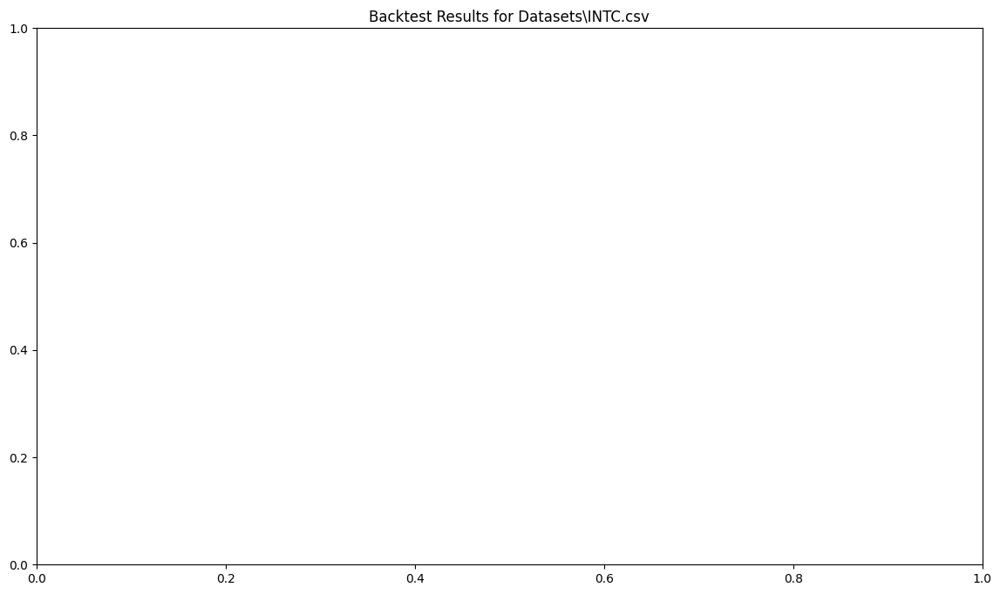

Backtest results for Datasets\INTC.csv:
Start                     2014-01-02 00:00:00
End                       2023-12-29 00:00:00
Duration                   3648 days 00:00:00
Exposure Time [%]                   49.841017
Equity Final [$]                 14045.285524
Equity Peak [$]                  17697.052027
Return [%]                          40.452855
Buy & Hold Return [%]               94.842955
Return (Ann.) [%]                    3.460962
Volatility (Ann.) [%]               24.068871
Sharpe Ratio                         0.143794
Sortino Ratio                        0.215353
Calmar Ratio                         0.073921
Max. Drawdown [%]                  -46.819824
Avg. Drawdown [%]                   -5.034744
Max. Drawdown Duration     1708 days 00:00:00
Avg. Drawdown Duration      117 days 00:00:00
# Trades                                   78
Win Rate [%]                        69.230769
Best Trade [%]                       9.692952
Worst Trade [%]                    -24.6

C:\Users\23713\anaconda3\envs\pytorch\lib\site-packages\backtesting\_plotting.py:250: UserWarning: DatetimeFormatter scales now only accept a single format. Using the first provided: '%d %b'
  formatter=DatetimeTickFormatter(days=['%d %b', '%a %d'],
C:\Users\23713\anaconda3\envs\pytorch\lib\site-packages\backtesting\_plotting.py:250: UserWarning: DatetimeFormatter scales now only accept a single format. Using the first provided: '%m/%Y'
  formatter=DatetimeTickFormatter(days=['%d %b', '%a %d'],


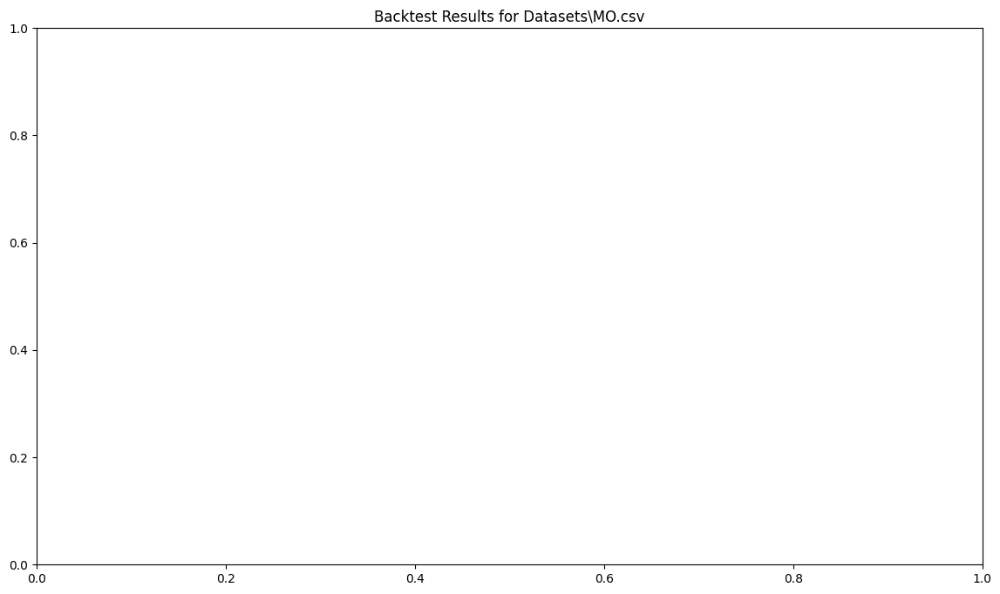

Backtest results for Datasets\MO.csv:
Start                     2014-01-02 00:00:00
End                       2023-12-29 00:00:00
Duration                   3648 days 00:00:00
Exposure Time [%]                   46.383148
Equity Final [$]                 10416.842735
Equity Peak [$]                  13910.007269
Return [%]                           4.168427
Buy & Hold Return [%]                6.437989
Return (Ann.) [%]                    0.409876
Volatility (Ann.) [%]               16.762235
Sharpe Ratio                         0.024452
Sortino Ratio                        0.033455
Calmar Ratio                          0.00829
Max. Drawdown [%]                  -49.440533
Avg. Drawdown [%]                   -6.302789
Max. Drawdown Duration     1873 days 00:00:00
Avg. Drawdown Duration      207 days 00:00:00
# Trades                                   74
Win Rate [%]                        63.513514
Best Trade [%]                       7.292125
Worst Trade [%]                    -21.734

C:\Users\23713\anaconda3\envs\pytorch\lib\site-packages\backtesting\_plotting.py:250: UserWarning: DatetimeFormatter scales now only accept a single format. Using the first provided: '%d %b'
  formatter=DatetimeTickFormatter(days=['%d %b', '%a %d'],
C:\Users\23713\anaconda3\envs\pytorch\lib\site-packages\backtesting\_plotting.py:250: UserWarning: DatetimeFormatter scales now only accept a single format. Using the first provided: '%m/%Y'
  formatter=DatetimeTickFormatter(days=['%d %b', '%a %d'],


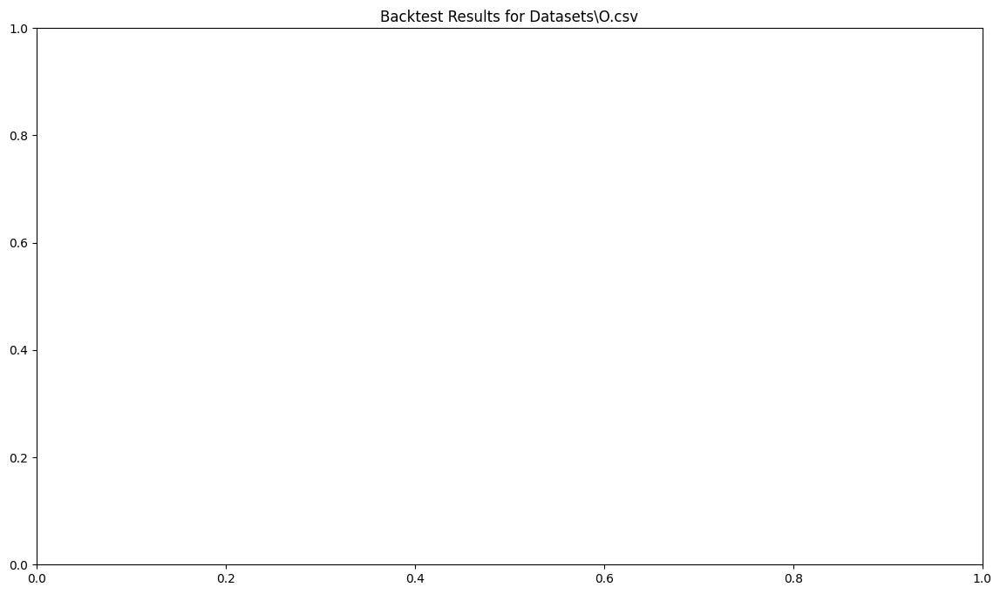

Backtest results for Datasets\O.csv:
Start                     2014-01-02 00:00:00
End                       2023-03-10 00:00:00
Duration                   3354 days 00:00:00
Exposure Time [%]                   45.438824
Equity Final [$]                 12286.184017
Equity Peak [$]                  14667.183604
Return [%]                           22.86184
Buy & Hold Return [%]                69.59615
Return (Ann.) [%]                    2.268511
Volatility (Ann.) [%]               21.879736
Sharpe Ratio                         0.103681
Sortino Ratio                        0.141138
Calmar Ratio                          0.04993
Max. Drawdown [%]                  -45.434101
Avg. Drawdown [%]                   -9.037272
Max. Drawdown Duration     1090 days 00:00:00
Avg. Drawdown Duration      177 days 00:00:00
# Trades                                   67
Win Rate [%]                        64.179104
Best Trade [%]                      15.542048
Worst Trade [%]                    -20.7948

C:\Users\23713\anaconda3\envs\pytorch\lib\site-packages\backtesting\_plotting.py:250: UserWarning: DatetimeFormatter scales now only accept a single format. Using the first provided: '%d %b'
  formatter=DatetimeTickFormatter(days=['%d %b', '%a %d'],
C:\Users\23713\anaconda3\envs\pytorch\lib\site-packages\backtesting\_plotting.py:250: UserWarning: DatetimeFormatter scales now only accept a single format. Using the first provided: '%m/%Y'
  formatter=DatetimeTickFormatter(days=['%d %b', '%a %d'],


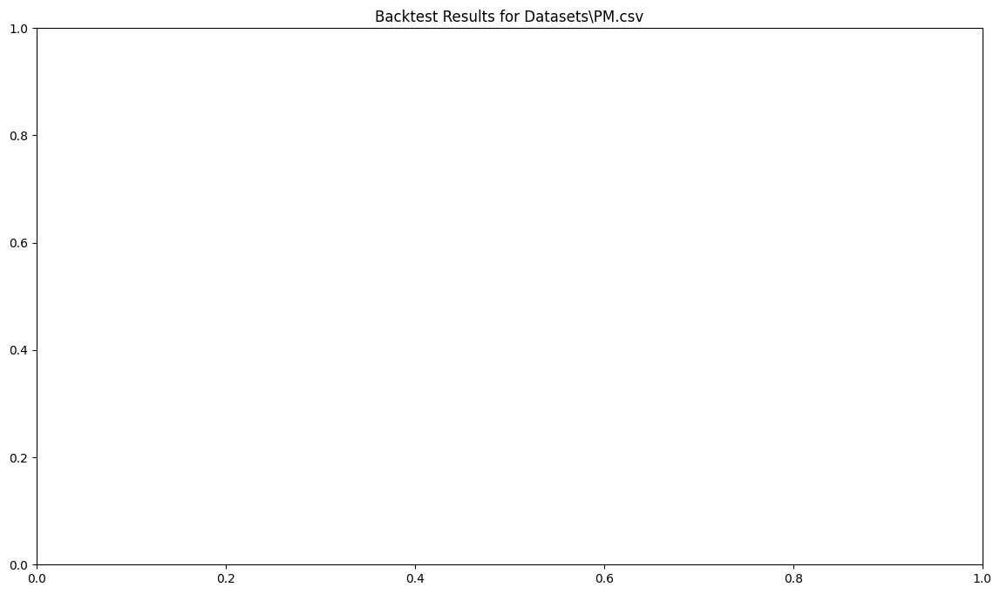

Backtest results for Datasets\PM.csv:
Start                     2014-01-02 00:00:00
End                       2023-12-29 00:00:00
Duration                   3648 days 00:00:00
Exposure Time [%]                   48.211447
Equity Final [$]                  10026.99835
Equity Peak [$]                  13466.719999
Return [%]                           0.269983
Buy & Hold Return [%]                 9.36992
Return (Ann.) [%]                    0.027008
Volatility (Ann.) [%]               17.276443
Sharpe Ratio                         0.001563
Sortino Ratio                        0.002122
Calmar Ratio                         0.000616
Max. Drawdown [%]                  -43.846217
Avg. Drawdown [%]                   -3.879406
Max. Drawdown Duration     2293 days 00:00:00
Avg. Drawdown Duration      126 days 00:00:00
# Trades                                   87
Win Rate [%]                        65.517241
Best Trade [%]                       6.149042
Worst Trade [%]                    -18.204

C:\Users\23713\anaconda3\envs\pytorch\lib\site-packages\backtesting\_plotting.py:250: UserWarning: DatetimeFormatter scales now only accept a single format. Using the first provided: '%d %b'
  formatter=DatetimeTickFormatter(days=['%d %b', '%a %d'],
C:\Users\23713\anaconda3\envs\pytorch\lib\site-packages\backtesting\_plotting.py:250: UserWarning: DatetimeFormatter scales now only accept a single format. Using the first provided: '%m/%Y'
  formatter=DatetimeTickFormatter(days=['%d %b', '%a %d'],


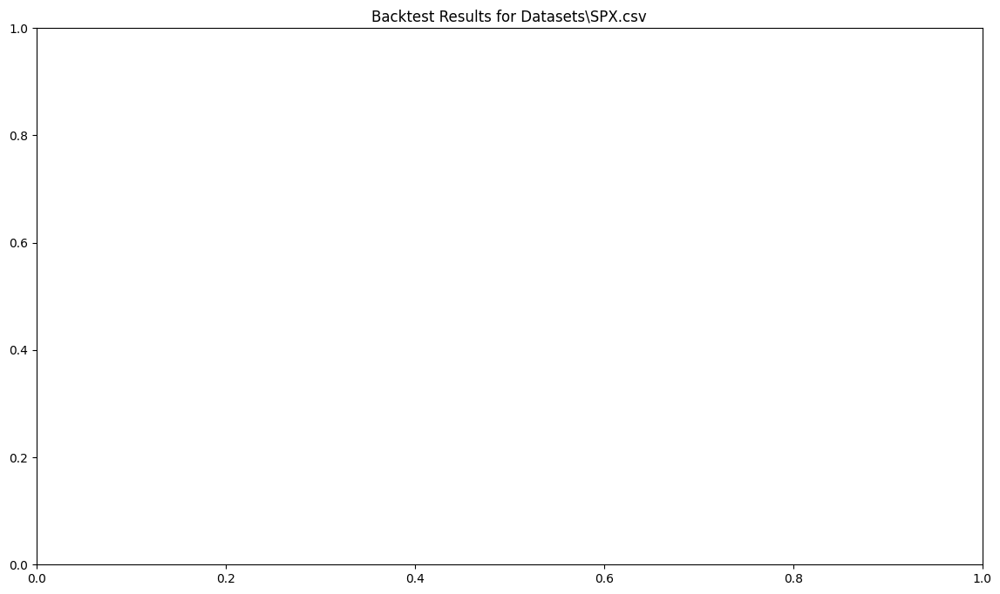

Backtest results for Datasets\SPX.csv:
Start                     2014-01-02 00:00:00
End                       2023-12-29 00:00:00
Duration                   3648 days 00:00:00
Exposure Time [%]                   40.858506
Equity Final [$]                  18410.86269
Equity Peak [$]                   19522.22011
Return [%]                          84.108627
Buy & Hold Return [%]              160.364749
Return (Ann.) [%]                    6.303988
Volatility (Ann.) [%]               14.657634
Sharpe Ratio                         0.430082
Sortino Ratio                        0.642864
Calmar Ratio                         0.212475
Max. Drawdown [%]                  -29.669271
Avg. Drawdown [%]                    -2.16224
Max. Drawdown Duration      716 days 00:00:00
Avg. Drawdown Duration       40 days 00:00:00
# Trades                                   78
Win Rate [%]                        80.769231
Best Trade [%]                       5.512537
Worst Trade [%]                    -15.44

C:\Users\23713\anaconda3\envs\pytorch\lib\site-packages\backtesting\_plotting.py:250: UserWarning: DatetimeFormatter scales now only accept a single format. Using the first provided: '%d %b'
  formatter=DatetimeTickFormatter(days=['%d %b', '%a %d'],
C:\Users\23713\anaconda3\envs\pytorch\lib\site-packages\backtesting\_plotting.py:250: UserWarning: DatetimeFormatter scales now only accept a single format. Using the first provided: '%m/%Y'
  formatter=DatetimeTickFormatter(days=['%d %b', '%a %d'],


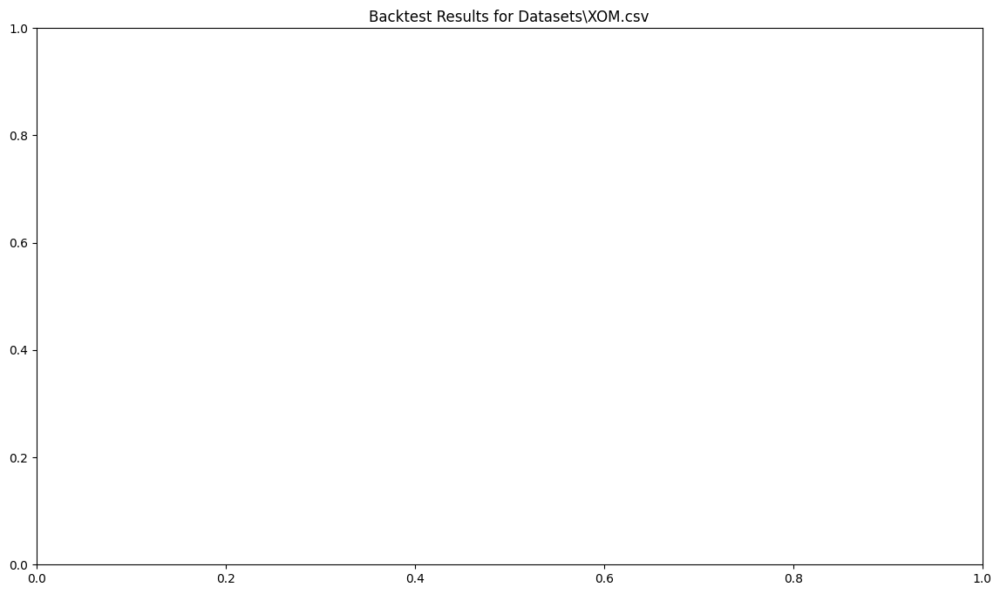

Backtest results for Datasets\XOM.csv:
Start                     2014-01-02 00:00:00
End                       2023-12-29 00:00:00
Duration                   3648 days 00:00:00
Exposure Time [%]                   52.424483
Equity Final [$]                 13281.563469
Equity Peak [$]                  14500.123085
Return [%]                          32.815635
Buy & Hold Return [%]                0.230579
Return (Ann.) [%]                    2.883212
Volatility (Ann.) [%]               21.565104
Sharpe Ratio                         0.133698
Sortino Ratio                        0.201537
Calmar Ratio                         0.047103
Max. Drawdown [%]                  -61.210629
Avg. Drawdown [%]                    -7.76381
Max. Drawdown Duration     1366 days 00:00:00
Avg. Drawdown Duration      131 days 00:00:00
# Trades                                   82
Win Rate [%]                        63.414634
Best Trade [%]                      13.610908
Worst Trade [%]                    -40.04

In [12]:
import pandas as pd
import numpy as np
import pandas_ta as ta
from backtesting import Backtest, Strategy
from backtesting.lib import crossover
import scipy.stats as stats
import glob
import matplotlib.pyplot as plt

# 定义函数以加载数据并运行回测
def run_backtest(file_path):
    # 加载数据
    data = pd.read_csv(file_path, parse_dates=['Date'])
    data.set_index('Date', inplace=True)

    # 删除NaN值
    data = data.dropna()

    # 定义布林带指标函数
    def indicator(data):
        bbands = ta.bbands(close=data.Close, std=1, length=14)  # 设定标准差和时间周期
        if bbands is not None:
            return bbands[['BBL_14_1.0', 'BBM_14_1.0', 'BBU_14_1.0']].to_numpy().T
        else:
            return np.array([[], [], []])

    # 定义策略类
    class DFStrategy(Strategy):
        def init(self):
            self.bbands = self.I(indicator, self.data.df)

        def next(self):
            lower_band = self.bbands[0]
            upper_band = self.bbands[2]
            if self.position:
                if self.data.Close[-1] > upper_band[-1]:
                    self.position.close()
            else:
                if self.data.Close[-1] < lower_band[-1]:
                    self.buy()

    # 运行回测
    bt = Backtest(data, DFStrategy, cash=10_000)
    stats = bt.run()

    # 绘制回测结果
    plt.figure(figsize=(14, 8))
    bt.plot()
    plt.title(f'Backtest Results for {file_path.split("/")[-1]}')
    plt.show()

    # 显示回测结果
    print(f"Backtest results for {file_path.split('/')[-1]}:")
    print(stats)

    # 计算波动率（Volatility）
    returns = data['Close'].pct_change().dropna()
    std_dev_returns = returns.std()
    annual_volatility = std_dev_returns * np.sqrt(252)
    current_volatility = std_dev_returns
    historical_volatility = returns.rolling(window=252).std().dropna().mean()

    print(f"Standard Deviation of Returns: {std_dev_returns:.4f}")
    print(f"Annual Volatility: {annual_volatility:.4f}")
    print(f"Current Volatility: {current_volatility:.4f}")
    print(f"Historical Volatility: {historical_volatility:.4f}")

    # 计算最大回撤（Maximum Drawdown）
    equity_curve = stats['_equity_curve']['Equity']
    max_drawdown = ((equity_curve / equity_curve.cummax()) - 1).min()
    print(f"Maximum Drawdown: {max_drawdown:.4f}")

    # 计算贝塔系数（Beta）
    market_returns = data['Close'].pct_change().dropna()
    cov_matrix = np.cov(returns, market_returns)
    beta = cov_matrix[0, 1] / cov_matrix[1, 1]
    print(f"Beta: {beta:.4f}")

    # 计算在险价值（Value-at-Risk, VaR）
    confidence_level = 0.95
    VaR = np.percentile(returns, (1 - confidence_level) * 100)
    print(f"VaR at {confidence_level*100}% confidence level: {VaR:.4f}")

    # 计算条件在险价值（Conditional VaR, CVaR）
    CVaR = returns[returns <= VaR].mean()
    print(f"CVaR at {confidence_level*100}% confidence level: {CVaR:.4f}")

# 获取所有股票文件的路径
file_paths = glob.glob('./Datasets/*.csv')

# 遍历每个文件并运行回测
for file_path in file_paths:
    run_backtest(file_path)
